# **Trabajo 01: Fundamentos y calibración de una cámara**

Visión por Computador

Universidad Nacional de Colombia - Sede Medellín

Grupo: QuantumViz

*   Santiago Betancur Montoya
*   Reinaldo David Lopez Narvaez
*   Jose Sebastian Garzon Parra
*   Monica Paola Vargas Tirado









In [13]:
# Módulos estándar
import glob
import os

# Librerías externas
import cv2 as cv
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from PIL import Image

In [14]:
# Verificacion de versiones

print(f"Versión de NumPy: {np.__version__}")
print(f"Versión de OpenCV: {cv.__version__}")
print(f"Versión de Matplotlib: {matplotlib.__version__}")
print(f"Versión de Pillow: {Image.__version__}")

Versión de NumPy: 2.2.6
Versión de OpenCV: 4.12.0
Versión de Matplotlib: 3.10.6
Versión de Pillow: 11.3.0


## 1. Calibración de cámaras

['Dataset/Tablero\\Img_10.jpeg', 'Dataset/Tablero\\Img_11.jpeg', 'Dataset/Tablero\\Img_12.jpeg', 'Dataset/Tablero\\Img_13.jpeg', 'Dataset/Tablero\\Img_14.jpeg', 'Dataset/Tablero\\Img_15.jpeg', 'Dataset/Tablero\\Img_16.jpeg', 'Dataset/Tablero\\Img_17.jpeg', 'Dataset/Tablero\\Img_18.jpeg', 'Dataset/Tablero\\Img_19.jpeg', 'Dataset/Tablero\\Img_20.jpeg', 'Dataset/Tablero\\Img_21.jpeg', 'Dataset/Tablero\\Img_22.jpeg', 'Dataset/Tablero\\Img_23.jpeg', 'Dataset/Tablero\\Img_24.jpeg', 'Dataset/Tablero\\Img_25.jpeg', 'Dataset/Tablero\\Img_26.jpeg', 'Dataset/Tablero\\Img_27.jpeg', 'Dataset/Tablero\\Img_28.jpeg', 'Dataset/Tablero\\Img_29.jpeg', 'Dataset/Tablero\\Img_30.jpeg', 'Dataset/Tablero\\Img_7.jpeg', 'Dataset/Tablero\\Img_8.jpeg', 'Dataset/Tablero\\Img_9.jpeg']
Imágenes encontradas: 24


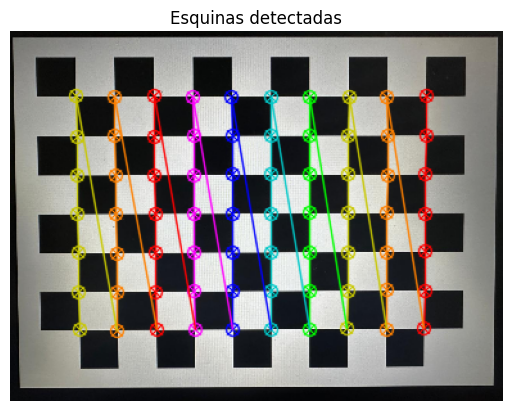

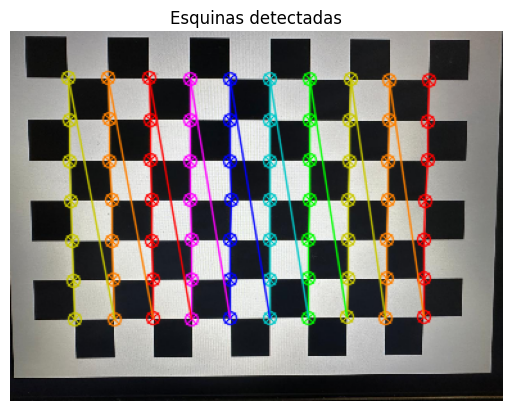

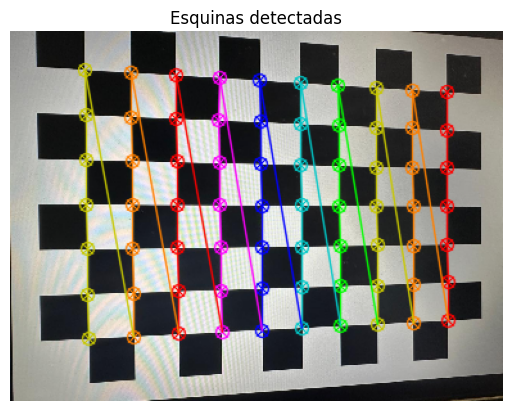

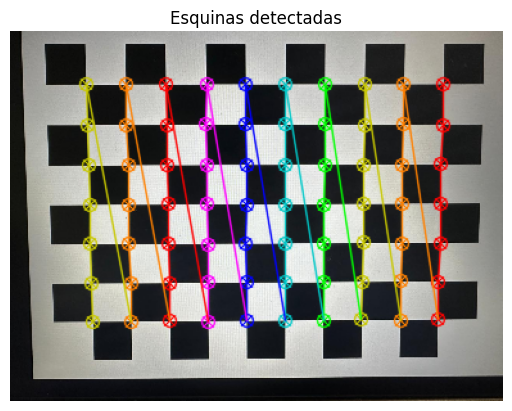

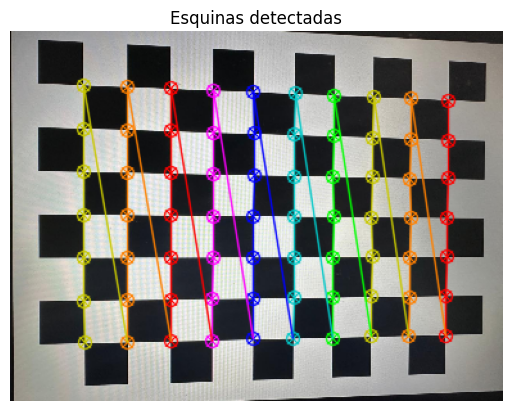

...

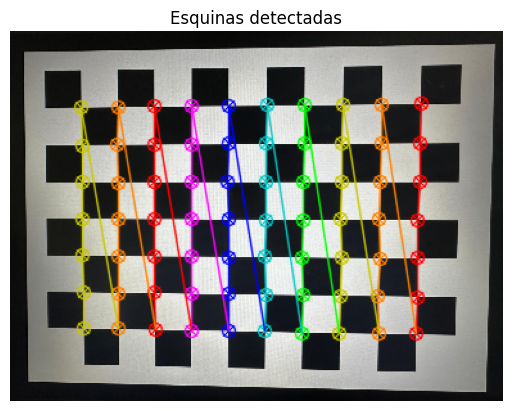

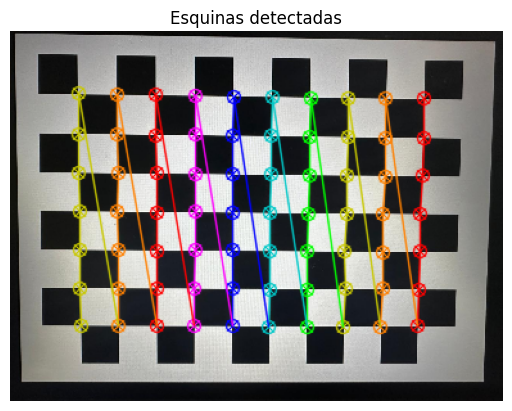

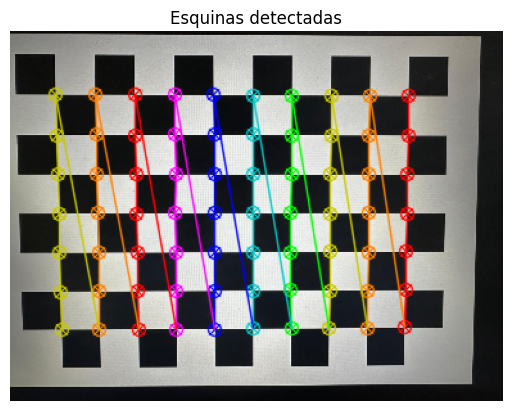

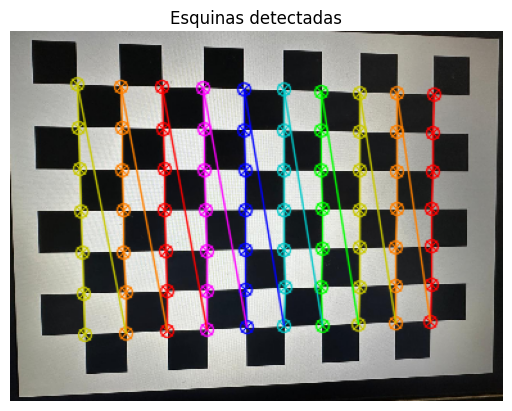

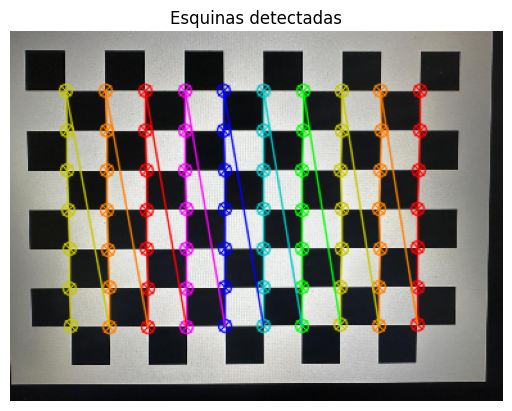

In [15]:
# Parámetros de configuración

# Dimensiones internas del tablero de ajedrez (número de esquinas visibles)
CHECKERBOARD = (7,10)

# Criterio de terminación para la refinación de esquinas
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Vectores para almacenar puntos 3D y 2D
objpoints = []  # puntos 3D en el espacio real
imgpoints = []  # puntos 2D proyectados en la imagen

# Coordenadas del tablero en el espacio 3D (z = 0 porque es plano)
objp = np.zeros((1, CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)

# Lectura de imagenes
images = glob.glob('Dataset/Tablero/**.jpeg')
print(images)
# images = glob.glob('/content/drive/MyDrive/Maestría/Visión por Computador/Taller_1/Dataset/Tablero/**.jpeg')
print("Imágenes encontradas:", len(images))

for fname in images:
    img = cv.imread(fname)
    # Reducir tamaño de imagen (30% del original)
    img = cv.resize(img, (0,0), fx=0.3, fy=0.3)

    # Convertir a escala de grises
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Buscar esquinas del tablero
    ret, corners = cv.findChessboardCorners(gray, CHECKERBOARD,
                                            cv.CALIB_CB_ADAPTIVE_THRESH +
                                            cv.CALIB_CB_FAST_CHECK +
                                            cv.CALIB_CB_NORMALIZE_IMAGE)

    # Si se encuentran las esquinas
    if ret == True:
        objpoints.append(objp)
        # Refinar las coordenadas de las esquinas
        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # Dibujar las esquinas encontradas sobre la imagen
        img = cv.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)

        # Convertir de BGR (formato de OpenCV) a RGB (formato de Matplotlib)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        # Mostrar en el notebook
        plt.imshow(img_rgb)
        plt.title('Esquinas detectadas')
        plt.axis('off')
        plt.show()
cv.destroyAllWindows()


In [16]:
# Calibración de la cámara

ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print("\n Calibración completada")
print("Matriz de cámara (K):\n", mtx)
print("\nCoeficientes de distorsión [k1, k2, p1, p2, k3]:\n", dist)
print("\nError RMS de reproyección:", ret)



 Calibración completada
Matriz de cámara (K):
 [[280.42734386   0.         183.66614512]
 [  0.         281.56304822 164.88197766]
 [  0.           0.           1.        ]]

Coeficientes de distorsión [k1, k2, p1, p2, k3]:
 [[ 0.01790873 -0.08181413  0.00076446  0.00117223  0.09884106]]

Error RMS de reproyección: 0.2760536422990318


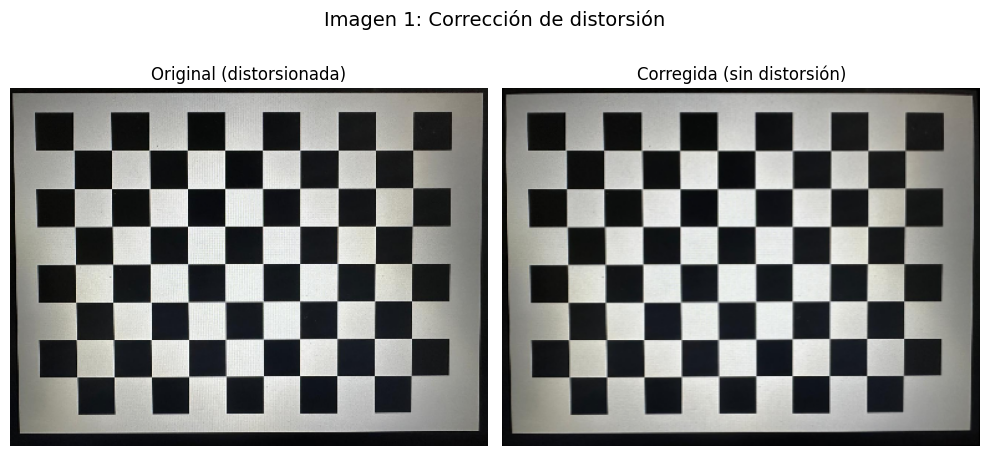

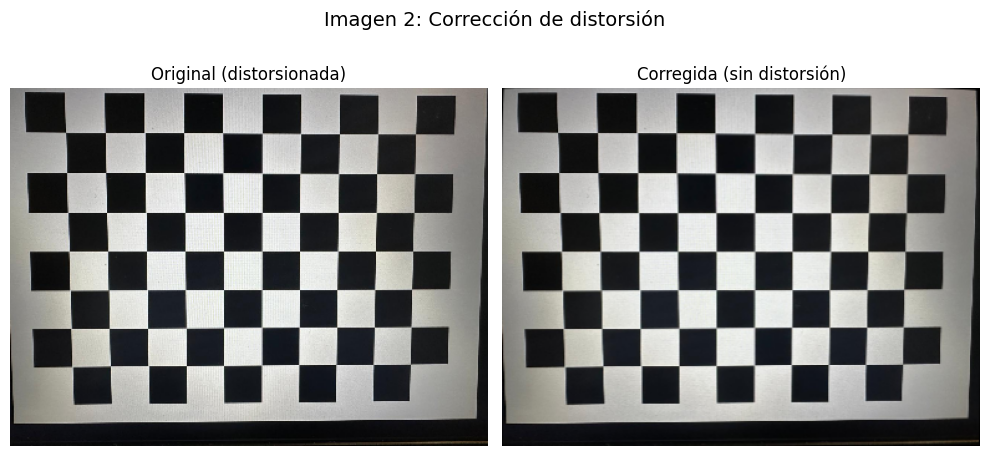

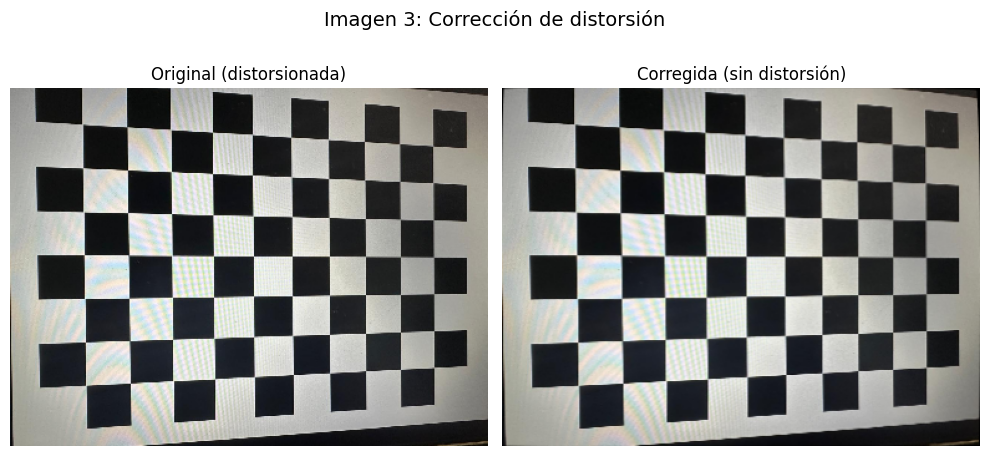

In [17]:
# Corregir distorsión

# Crear carpeta de resultados
os.makedirs('Resultados/resultados_calibracion', exist_ok=True)

# Mostrar 3 imágenes originales vs corregidas
for i, fname in enumerate(images[:3]):
    img = cv.imread(fname)
    img = cv.resize(img, (0,0), fx=0.3, fy=0.3)  # redimensionar para visualización
    h, w = img.shape[:2]

    # Calcular nueva matriz de cámara y corregir distorsión
    newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    undistorted = cv.undistort(img, mtx, dist, None, newcameramtx)

    # Mostrar comparativa lado a lado
    plt.figure(figsize=(10,5))
    plt.suptitle(f'Imagen {i+1}: Corrección de distorsión', fontsize=14)
    plt.subplot(1,2,1)
    plt.title("Original (distorsionada)")
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title("Corregida (sin distorsión)")
    plt.imshow(cv.cvtColor(undistorted, cv.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.savefig(f'Resultados/resultados_calibracion/comparacion_{i+1}.png', bbox_inches='tight')
    plt.show()

**Análisis de los parámetros de calibración**

**- ¿Qué tipo de distorsión predomina (barril o cojín)?**

El tipo de distorsión que predomina es radial de tipo barril, ya que los coeficientes
𝑘2 y 𝑘3 son positivos, y las imágenes originales evidencian una curvatura hacia afuera en los bordes. Este comportamiento indica que las líneas rectas se deforman de forma convexa hacia el exterior del centro de la imagen. Los valores de los coeficientes radiales respaldan este patrón típico de distorsión por barril, común en cámaras con lentes gran angular o cuando el centro óptico no coincide perfectamente con el plano del sensor.

**-¿La longitud focal 𝑓𝑥 es similar a 𝑓𝑦? ¿Por qué podría diferir?**

Los valores de 𝑓𝑥=280.4 y 𝑓𝑦=281.6 son muy similares, lo que sugiere que los píxeles del sensor son prácticamente cuadrados y que no se produjo un escalado anisótropo durante la captura o el procesamiento de las imágenes.

Las pequeñas diferencias entre ambos valores pueden deberse a errores de muestreo o interpolación durante la redimensión de las imágenes ruido en la detección de esquinas, o ligeras imperfecciones del sensor o la lente.

En general, la similitud entre 𝑓𝑥 y 𝑓𝑦 indica una calibración precisa y una buena relación geométrica entre los ejes X e Y del sensor.

**-¿El punto principal (𝑐𝑥,𝑐𝑦) está cerca del centro de la imagen?**

El punto principal obtenido (𝑐𝑥,𝑐𝑦) = (183.67,164.88) se encuentra muy próximo al centro del sensor en las imágenes calibradas. Esto indica que el eje óptico está bien alineado con el centro del sensor y que no existen desplazamientos significativos en la proyección.
Una desviación leve es normal y puede deberse a tolerancias mecánicas en el montaje de la cámara o a pequeñas variaciones en la posición del tablero durante la toma de datos.

**Conclusión general:**

La calibración realizada evidencia una buena alineación geométrica y óptica de la cámara.

El modelo de distorsión radial tipo barril se manifiesta principalmente en los bordes de las imágenes, donde las líneas rectas se curvan hacia afuera, pero la corrección de distorsión aplicada logra rectificarlas eficazmente, como se observa en las comparaciones visuales.

Los parámetros intrínsecos (𝑓𝑥,𝑓𝑦,𝑐𝑥,𝑐𝑦f) muestran consistencia y coherencia física, lo que confirma la validez del proceso de calibración.

El bajo error RMS de reproyección (≈ 0.27) indica que la correspondencia entre los puntos 2D observados y los puntos 3D proyectados es precisa, lo cual garantiza una reconstrucción geométrica confiable del entorno en aplicaciones de visión por computador.

##  2. Transformaciones de intensidad a nivel de píxel.

Imágenes cargadas correctamente.


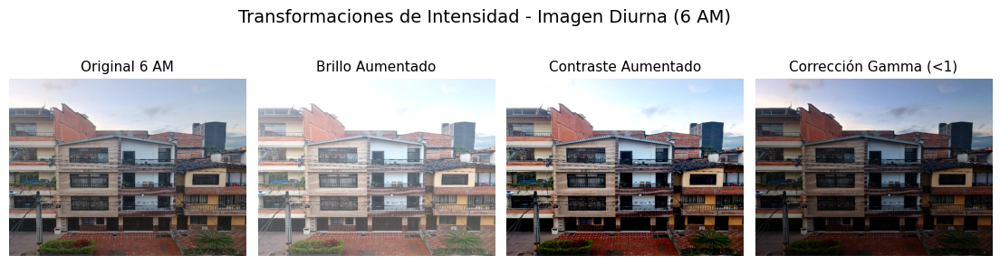

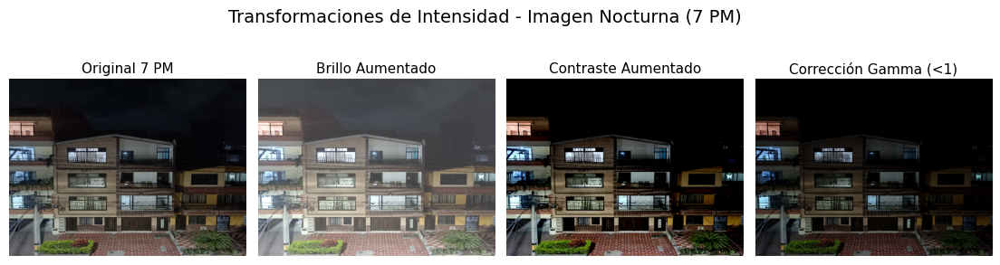

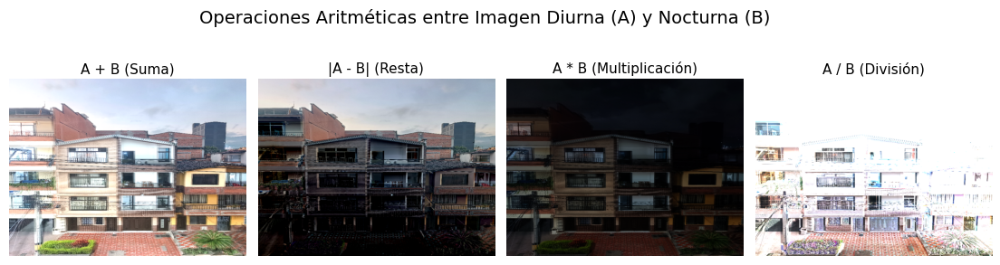

Resultados guardados en: Resultados/transformaciones_intensidad


In [18]:
# Cargas imágenes
img_dia = cv.imread('Dataset/Fachada/fachada_dia.jpg')
img_noche = cv.imread('Dataset/Fachada/fachada_noche.jpg')

if img_dia is None or img_noche is None:
    raise ValueError("Error al cargar las imágenes")

# Redimensionar ambas al mismo tamaño (reducción para visualización)
img_dia = cv.resize(img_dia, (800, 600))
img_noche = cv.resize(img_noche, (800, 600))

print("Imágenes cargadas correctamente.")

# Funciones auxiliares

def correccion_gamma(imagen, gamma):
    """Aplica corrección gamma usando una tabla de búsqueda (LUT)."""
    invGamma = 1.0 / gamma
    tabla = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(256)]).astype("uint8")
    return cv.LUT(imagen, tabla)

def to_float(img):
    """Convierte una imagen de uint8 a float32 (0-1)"""
    if img.dtype == np.uint8:
        img = img.astype(np.float32) / 255
    return img.astype(np.float32)

def to_uint8(img):
    """Convierte una imagen de float32 a uint8 (0-255)"""
    if img.dtype == np.float32:
        img = ((img * 255).round()).astype(np.uint8)
    return img

def ajuste_brillo(img, beta=0):
    """Ajusta el brillo de una imagen sumando beta"""
    img = to_float(img)
    beta = beta / 255.0
    img = img + beta
    img = np.clip(img, 0, 1)
    img = to_uint8(img)
    return img

def ajuste_contraste(img, alpha=1.2, pivot=0.5):
    """
    Ajusta el contraste de la imagen.
    alpha > 1  -> más contraste
    0 < alpha < 1 -> menos contraste
    """
    img = to_float(img)
    img = (img - pivot) * alpha + pivot
    img = np.clip(img, 0, 1)
    return to_uint8(img)

def sumar(img1, img2):
    """Suma dos imágenes pixel a pixel"""
    img1 = to_float(img1)
    img2 = to_float(img2)

    img_suma = img1 + img2
    img_suma = np.clip(img_suma, 0, 1)
    img_suma = to_uint8(img_suma)
    return img_suma

def restar(img1, img2):
    """Resta dos imágenes pixel a pixel"""
    img1 = to_float(img1)
    img2 = to_float(img2)

    img_resta = img1 - img2
    img_resta = np.clip(img_resta, 0, 1)
    img_resta = to_uint8(img_resta)
    return img_resta

def multiplicar(img1, img2):
    """Multiplica dos imágenes pixel a pixel"""
    img1 = to_float(img1)
    img2 = to_float(img2)

    img_mult = img1 * img2
    img_mult = np.clip(img_mult, 0, 1)
    img_mult = to_uint8(img_mult)
    return img_mult

def dividir(img1, img2):
    """Divide dos imágenes pixel a pixel, evitando división por cero"""
    img1 = to_float(img1)
    img2 = to_float(img2)
    img2 = np.clip(img2, 1e-8, 1)

    img_div = img1 / img2
    img_div = np.clip(img_div, 0, 1)
    img_div = to_uint8(img_div)
    return img_div


# Transformaciones de intensidad (para ambas imágenes)

# Imagen Día (6 AM)
brillo_dia = ajuste_brillo(img_dia, beta=60)
contraste_dia = ajuste_contraste(img_dia, alpha=1.5)
gamma_dia = correccion_gamma(img_dia, 0.5)

# Imagen Noche (7 PM)
brillo_noche = ajuste_brillo(img_noche, beta=60)
contraste_noche = ajuste_contraste(img_noche, alpha=1.5)
gamma_noche = correccion_gamma(img_noche, 0.5)


suma = sumar(img_dia, img_noche)
resta = restar(img_dia, img_noche)
multiplicacion = multiplicar(img_dia, img_noche)
division = dividir(img_dia, img_noche)


# Visualización de resultados

# Crear carpeta de resultados
output_dir = 'Resultados/transformaciones_intensidad'
os.makedirs(output_dir, exist_ok=True)

# Tranformaciones imagen diurna
imagenes_dia = [
    (img_dia, "Original 6 AM"),
    (brillo_dia, "Brillo Aumentado"),
    (contraste_dia, "Contraste Aumentado"),
    (gamma_dia, "Corrección Gamma (<1)")
]

plt.figure(figsize=(14, 5))
plt.suptitle("Transformaciones de Intensidad - Imagen Diurna (6 AM)", fontsize=14, y=0.8)
for i, (imagen, titulo) in enumerate(imagenes_dia):
    plt.subplot(1, 4, i + 1)
    plt.imshow(cv.cvtColor(imagen, cv.COLOR_BGR2RGB))
    plt.title(titulo, fontsize=11, pad=6)
    plt.axis('off')
plt.subplots_adjust(top=0.85, bottom=0.05, wspace=0.05, hspace=0.05)
plt.show()

# Tranformaciones imagen nocturna
imagenes_noche = [
    (img_noche, "Original 7 PM"),
    (brillo_noche, "Brillo Aumentado"),
    (contraste_noche, "Contraste Aumentado"),
    (gamma_noche, "Corrección Gamma (<1)")
]

plt.figure(figsize=(14, 5))
plt.suptitle("Transformaciones de Intensidad - Imagen Nocturna (7 PM)", fontsize=14, y=0.8)
for i, (imagen, titulo) in enumerate(imagenes_noche):
    plt.subplot(1, 4, i + 1)
    plt.imshow(cv.cvtColor(imagen, cv.COLOR_BGR2RGB))
    plt.title(titulo, fontsize=11, pad=4)
    plt.axis('off')
plt.subplots_adjust(top=0.85, bottom=0.05, wspace=0.05, hspace=0.05)
plt.show()

# Operaciones entre ambas imágenes
imagenes_op = [
    (suma, "A + B (Suma)"),
    (resta, "|A - B| (Resta)"),
    (multiplicacion, "A * B (Multiplicación)"),
    (division, "A / B (División)")
]

plt.figure(figsize=(14, 5))
plt.suptitle("Operaciones Aritméticas entre Imagen Diurna (A) y Nocturna (B)", fontsize=14, y=0.8)
for i, (imagen, titulo) in enumerate(imagenes_op):
    plt.subplot(1, 4, i + 1)
    plt.imshow(cv.cvtColor(imagen, cv.COLOR_BGR2RGB))
    plt.title(titulo, fontsize=11, pad=4)
    plt.axis('off')
plt.subplots_adjust(top=0.85, bottom=0.05, wspace=0.05, hspace=0.05)
plt.show()


# Guardar resultados
imagenes_guardar = {
    "01_dia_original.jpg": img_dia,
    "02_dia_brillo.jpg": brillo_dia,
    "03_dia_contraste.jpg": contraste_dia,
    "04_dia_gamma.jpg": gamma_dia,
    "05_noche_original.jpg": img_noche,
    "06_noche_brillo.jpg": brillo_noche,
    "07_noche_contraste.jpg": contraste_noche,
    "08_noche_gamma.jpg": gamma_noche,
    "09_suma.jpg": suma,
    "10_resta.jpg": resta,
    "11_multiplicacion.jpg": multiplicacion,
    "12_division.jpg": division
}

for nombre, imagen in imagenes_guardar.items():
    cv.imwrite(os.path.join(output_dir, nombre), imagen)

print(f"Resultados guardados en: {output_dir}")


**Conclusión:**

La aplicación de transformaciones de intensidad a nivel de píxel permite modificar de forma controlada las características visuales de una imagen según las condiciones de iluminación.
En la imagen diurna, los ajustes de brillo y contraste evidencian cómo el aumento del brillo realza las zonas claras pero puede provocar pérdida de detalle, mientras que el incremento del contraste mejora la definición de bordes y sombras. La corrección gamma (γ < 1) permite iluminar de manera más uniforme sin saturar los valores altos de intensidad, resultando especialmente útil para compensar condiciones de baja iluminación.

En la imagen nocturna, los mismos ajustes permiten resaltar detalles ocultos en sombras, aunque el aumento de brillo puede introducir ruido visual.

Las operaciones aritméticas entre imágenes (A y B) muestran distintos comportamientos:

* La suma (A + B) produce una fusión más brillante que combina información de ambas horas.

* La resta (|A - B|) resalta las diferencias de iluminación y cambio de color entre la mañana y la noche.

* La multiplicación (A * B) oscurece notablemente la escena, útil para análisis de coincidencia o regiones comunes.

* La división (A / B) amplifica diferencias de luminancia, destacando estructuras más iluminadas.

En conjunto, estos resultados muestran cómo las operaciones de intensidad son herramientas fundamentales en visión por computador, permitiendo mejorar la percepción visual, realizar correcciones fotométricas y facilitar etapas posteriores de segmentación o detección de características en condiciones de iluminación variables.

## 3. Transformaciones de rotación y traslación.

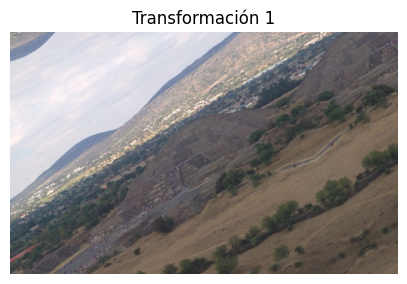

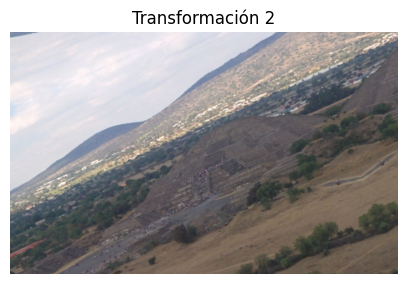

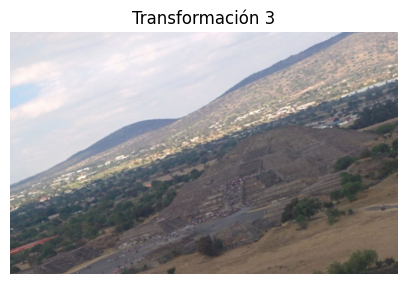

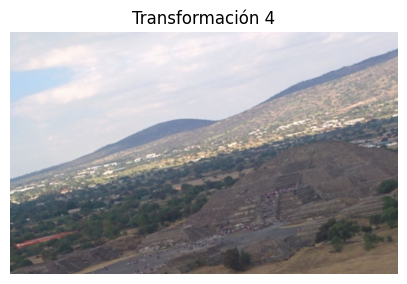

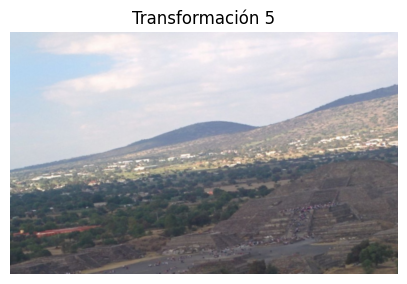

...

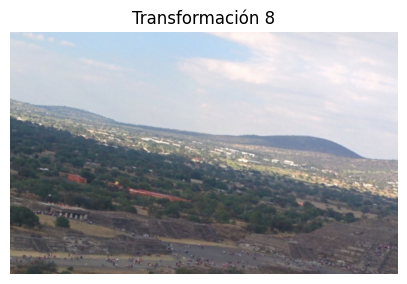

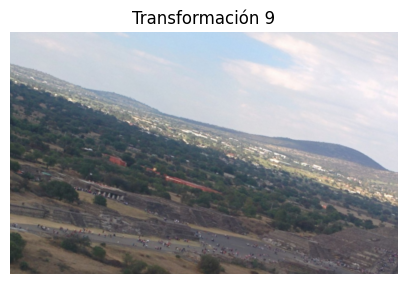

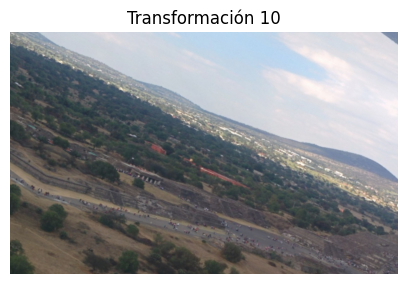

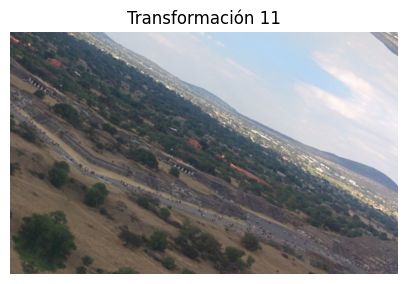

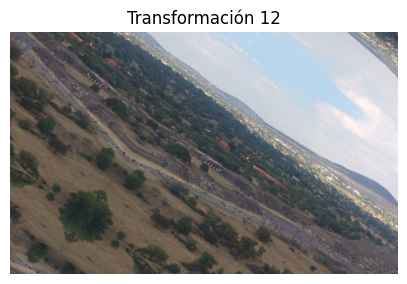


GIF generado correctamente: Resultados/transformaciones_geometricas\transformaciones.gif
Frames individuales guardados en: Resultados/transformaciones_geometricas


In [19]:
# --- Helpers de matrices homogéneas ---
def translation_matrix(tx: float, ty: float) -> np.ndarray:
    """Matriz de traslacion en coordenadas homogeneas 3x3."""
    M = np.array(
        [
            [1, 0, tx],
            [0, 1, ty],
            [0, 0, 1]
        ], dtype=float
    )
    return M

def rotation_matrix(deg: float, center=(0, 0)) -> np.ndarray:
    """Matriz de rotacion alrededor de 'center' en coordenadas homogeneas 3x3."""
    theta = np.deg2rad(deg)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(
        [
            [c, -s, 0],
            [s,  c, 0],
            [0,  0, 1]
        ], dtype=float
    )
    cx, cy = center
    T1 = translation_matrix(-cx, -cy)
    T2 = translation_matrix(cx, cy)
    return T2 @ R @ T1

def scale_matrix(sx: float, sy: float=None, center=(0, 0)) -> np.ndarray:
    """Matriz de escalamiento alrededor de 'center' en coordenadas homogeneas 3x3."""
    if sy is None:
        sy = sx
    S = np.array(
        [
            [sx, 0, 0],
            [0, sy, 0],
            [0, 0, 1]
        ], dtype=float
    )
    cx, cy = center
    T1 = translation_matrix(-cx, -cy)
    T2 = translation_matrix(cx, cy)
    return T2 @ S @ T1

def compose_matrix(
        translate=(0, 0),
        rotation_deg=0.0,
        scale=(1.0, 1.0),
        center=(0, 0)
    ) -> np.ndarray:
    """Compone una matriz homogenea 3x3 a partir de traslacion, rotacion y escala."""
    tx, ty = translate[0], translate[1]
    sx, sy = scale[0], scale[1]
    M_translate = translation_matrix(tx, ty)
    M_scale = scale_matrix(sx, sy, center=center)
    M_rot = rotation_matrix(rotation_deg, center=center)
    # Orden de composición: primero trasladar, luego rotar, luego escalar (ajústalo si lo quieres distinto)
    M = M_scale @ M_rot @ M_translate
    return M

def generate_transform_sequence(steps: int, h: int, w: int, center=None, params=None):
    """Genera una lista de matrices homogeneas 3x3 variando tx, ty, deg, sx, sy."""
    if center is None:
        center = (w / 2.0, h / 2.0)
    if params is None:
        params = {}

    tx_frac = params.get('tx_frac', 0.35)
    ty_frac = params.get('ty_frac', 0.25)
    rot_factor = params.get('rot_factor', 1.2)
    scalex_frac = params.get('scalex_frac', 0.60)
    scaley_frac = params.get('scaley_frac', 0.60)

    max_tx = w * tx_frac
    max_ty = h * ty_frac
    degrees_base = params.get('degrees_base', 30.0)
    max_rot = rot_factor * degrees_base
    max_scale_x = scalex_frac
    max_scale_y = scaley_frac

    seq = []
    for i in range(1, steps + 1):
        frac = i / steps

        tx = max_tx * (2 * frac - 1)              # de -max_tx a +max_tx
        ty = max_ty * np.sin(frac * np.pi)       # oscilante en y
        rot = max_rot * (2 * frac - 1)           # de -max_rot a +max_rot
        scale_x = 1.0 + max_scale_x * np.sin(frac * np.pi)
        scale_y = 1.0 + max_scale_y * np.sin(frac * np.pi)

        M = compose_matrix(
            translate=(tx, ty),
            rotation_deg=rot,
            scale=(scale_x, scale_y),
            center=center
        )

        seq.append(M)

    return seq

# --- Función principal actualizada ---
def aplicar_transformaciones(ruta_imagen, output_dir, steps=8, params=None, resize_to=(800, 500)):
    """
    Aplica una secuencia de transformaciones homogeneas y guarda frames + gif.
    Mantiene la lógica original (mostrar cada frame, guardar individualmente).
    """
    os.makedirs(output_dir, exist_ok=True)

    img = cv.imread(ruta_imagen)
    if img is None:
        raise ValueError("Error al cargar la imagen")

    # Redimensionar para mantener tamaño razonable
    img = cv.resize(img, resize_to)
    h, w = img.shape[:2]
    center = (w / 2.0, h / 2.0)

    # Generar la secuencia de matrices 3x3
    seq = generate_transform_sequence(steps=steps, h=h, w=w, center=center, params=params)

    frames = []
    for i, M in enumerate(seq):
        # cv.warpPerspective espera una matriz 3x3 de tipo float32/float64
        M_cv = M.astype(np.float32)

        # Aplicar la transformación con warpPerspective (transformación homogénea completa)
        img_trans = cv.warpPerspective(img, M_cv, (w, h), flags=cv.INTER_LINEAR, borderMode=cv.BORDER_REFLECT)

        # Guardar frame individual
        frame_path = os.path.join(output_dir, f"frame_{i+1:02d}.png")
        cv.imwrite(frame_path, img_trans)

        # Convertir a PIL (RGB) y añadir a la lista para el gif
        frames.append(Image.fromarray(cv.cvtColor(img_trans, cv.COLOR_BGR2RGB)))

        # Mostrar cada transformación (como en tu versión original)
        plt.figure(figsize=(5, 4))
        plt.title(f"Transformación {i+1}")
        plt.imshow(cv.cvtColor(img_trans, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    # Crear GIF animado
    if frames:
        gif_path = os.path.join(output_dir, "transformaciones.gif")
        frames[0].save(
            gif_path,
            save_all=True,
            append_images=frames[1:],
            duration=300,
            loop=0
        )
        print(f"\nGIF generado correctamente: {gif_path}")
    else:
        print("No se generaron frames.")

    print(f"Frames individuales guardados en: {output_dir}")

# --- Ejemplo de ejecución (ajusta rutas) ---
ruta_imagen = 'Dataset/paisaje.jpg'
output_dir = 'Resultados/transformaciones_geometricas'
aplicar_transformaciones(ruta_imagen, output_dir, steps=12)


**Conclusión:**

Se implementó una función que aplica rotaciones, traslaciones y escalados sucesivos sobre una imagen estática, generando una secuencia animada que evidencia los efectos acumulativos de estas transformaciones.

La animación obtenida muestra cómo la rotación modifica la orientación del plano de la imagen, mientras que las traslaciones desplazan su posición en el espacio de coordenadas y el escalado altera su tamaño relativo.
El resultado final permite visualizar de forma dinámica cómo las transformaciones afines afectan las coordenadas de los píxeles sin modificar su intensidad, lo cual es fundamental para tareas de alineamiento, registro, estabilización y seguimiento de objetos en visión por computador.

En síntesis, este ejercicio demuestra el control geométrico que puede ejercerse sobre una imagen mediante operaciones matriciales, reforzando la comprensión de cómo se representan y combinan las transformaciones espaciales en el dominio digital.

## 4. Distribución de intensidades de una imagen.

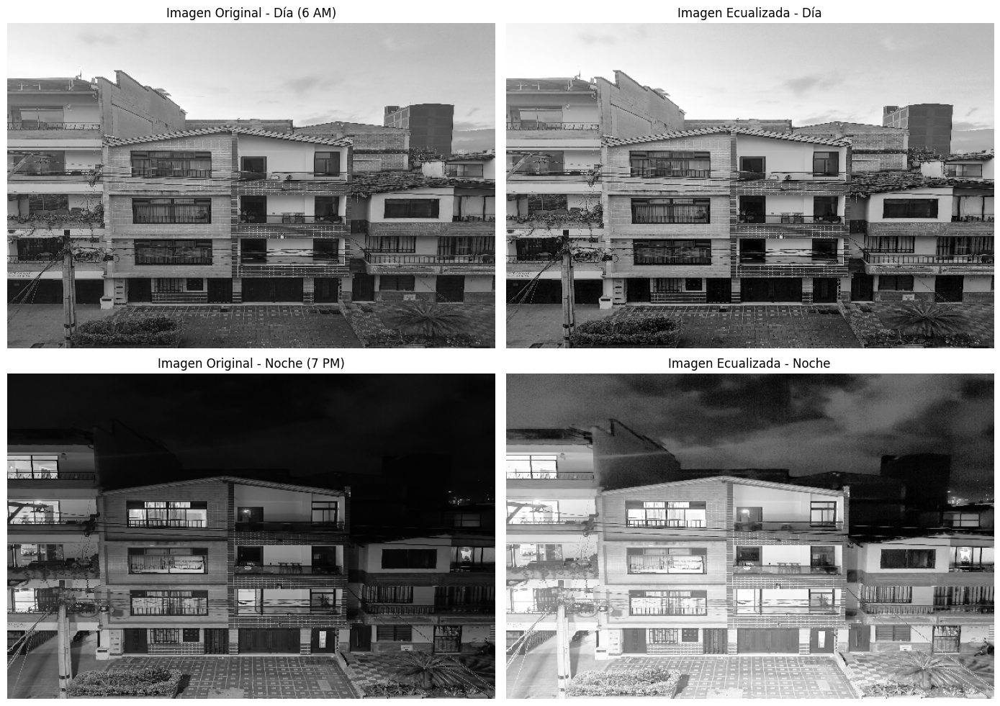

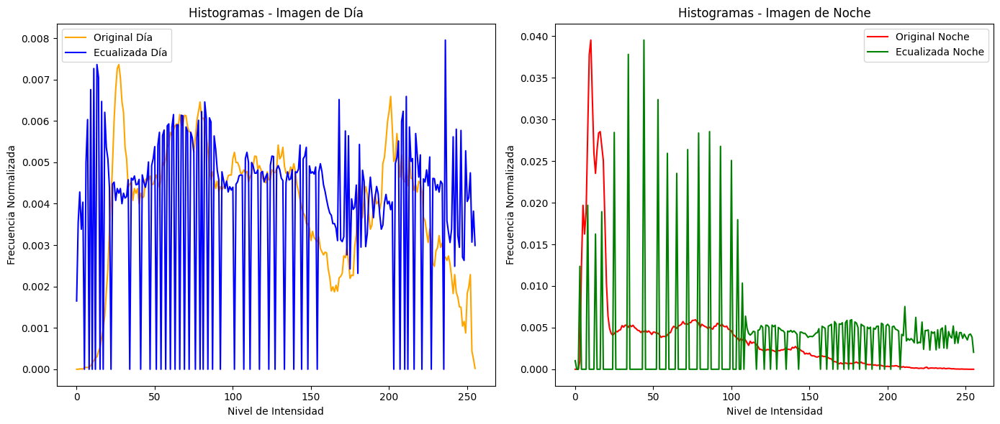

In [20]:
# Cargar imágenes
img_dia = cv.imread('Dataset/Fachada/fachada_dia.jpg')
img_noche = cv.imread('Dataset/Fachada/fachada_noche.jpg')

# Carpeta para los resultados
output_dir = 'Resultados/distribucion_intensidades'

# Verificación
if img_dia is None or img_noche is None:
    raise ValueError("Error al cargar las imágenes.")

# Redimensionar para uniformidad
img_dia = cv.resize(img_dia, (600, 400))
img_noche = cv.resize(img_noche, (600, 400))

#Convertir a escala de grises
gray_dia = cv.cvtColor(img_dia, cv.COLOR_BGR2GRAY)
gray_noche = cv.cvtColor(img_noche, cv.COLOR_BGR2GRAY)

# Ecualización de histograma
eq_dia = cv.equalizeHist(gray_dia)
eq_noche = cv.equalizeHist(gray_noche)

# Calcular histogramas antes y después
def calcular_histograma(img):
    hist = cv.calcHist([img], [0], None, [256], [0, 256])
    hist = hist / hist.sum()  # normalización
    cdf = hist.cumsum()
    return hist, cdf

hist_dia, cdf_dia = calcular_histograma(gray_dia)
hist_eq_dia, cdf_eq_dia = calcular_histograma(eq_dia)

hist_noche, cdf_noche = calcular_histograma(gray_noche)
hist_eq_noche, cdf_eq_noche = calcular_histograma(eq_noche)

# Visualización
plt.figure(figsize=(14,10))

# Imágenes originales y ecualizadas
plt.subplot(2, 2, 1)
plt.imshow(gray_dia, cmap='gray')
plt.title("Imagen Original - Día (6 AM)")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(eq_dia, cmap='gray')
plt.title("Imagen Ecualizada - Día")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(gray_noche, cmap='gray')
plt.title("Imagen Original - Noche (7 PM)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(eq_noche, cmap='gray')
plt.title("Imagen Ecualizada - Noche")
plt.axis('off')

plt.tight_layout()
plt.show()

imagenes = [gray_dia, eq_dia, gray_noche, eq_noche]
nombres = ["original_dia", "ecualizada_dia", "original_noche", "ecualizada_noche"]

for nombre, imagen in zip(nombres, imagenes):
    frame_path = os.path.join(output_dir, f"{nombre}.png")
    cv.imwrite(frame_path, imagen)


# Graficar histogramas
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.plot(hist_dia, label="Original Día", color='orange')
plt.plot(hist_eq_dia, label="Ecualizada Día", color='blue')
plt.title("Histogramas - Imagen de Día")
plt.xlabel("Nivel de Intensidad")
plt.ylabel("Frecuencia Normalizada")
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist_noche, label="Original Noche", color='red')
plt.plot(hist_eq_noche, label="Ecualizada Noche", color='green')
plt.title("Histogramas - Imagen de Noche")
plt.xlabel("Nivel de Intensidad")
plt.ylabel("Frecuencia Normalizada")
plt.legend()

plt.tight_layout()
ruta_figura = os.path.join(output_dir, "histogramas_dia_noche.png")
plt.savefig(ruta_figura)
plt.show()

**- ¿Qué diferencias hay entre los histogramas de la imagen tomada de día y la imagen tomada de noche?**

La imagen diurna presenta un histograma más distribuido a lo largo de los niveles de intensidad, con predominancia en tonos medios (grises), lo que indica una iluminación más equilibrada y mayor rango dinámico.

En cambio, la imagen nocturna tiene un histograma concentrado en las zonas de baja intensidad (valores oscuros), reflejando la escasez de luz y el predominio de sombras.

Después de la ecualización, el histograma nocturno se expande hacia todo el rango (0–255), mejorando el contraste y haciendo visibles detalles antes ocultos en las zonas oscuras. En la imagen diurna, el cambio es más sutil, pues ya contaba con buena iluminación y contraste natural.


**- ¿Cuáles son las transformaciones de ecualización en cada caso?**

En ambos casos se aplicó la ecualización de histograma basada en la función de distribución acumulada (CDF).

En la imagen diurna, la transformación redistribuyó ligeramente los valores de intensidad, realzando bordes y mejorando el contraste local sin alterar demasiado los colores.

En la imagen nocturna, la ecualización amplió drásticamente el rango tonal, aclarando las zonas oscuras y aumentando la visibilidad de estructuras, aunque también generó un aumento del ruido en áreas con baja iluminación.

**Conclusión:**

La ecualización del histograma es una herramienta eficaz para mejorar el contraste global de una imagen y resaltar detalles ocultos, especialmente en condiciones de baja luz.
Mientras que en imágenes bien iluminadas su efecto es moderado, en escenas nocturnas su impacto es mucho mayor, permitiendo recuperar información en zonas subexpuestas. No obstante, debe aplicarse con precaución, ya que puede incrementar el ruido o producir una apariencia artificial cuando se exagera la redistribución de intensidades.

## 5. Segmentación de imágenes.

Imagen original (colores reales):


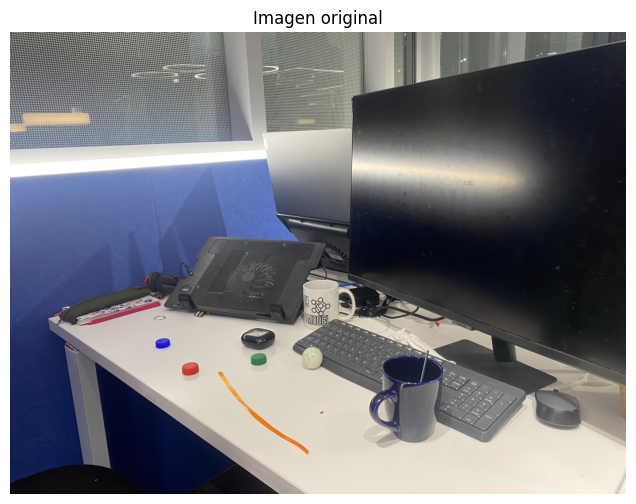

Resultados (color : cantidad de objetos) y áreas:
azul: 4 objetos | áreas = [679, 2198, 6713, 722]
verde: 1 objetos | áreas = [568]
naranja: 2 objetos | áreas = [1078, 503]
blanco: 3 objetos | áreas = [1940, 176237, 15481]
gris: 3 objetos | áreas = [14453, 2201, 93299]
rojo: 2 objetos | áreas = [664, 1016]


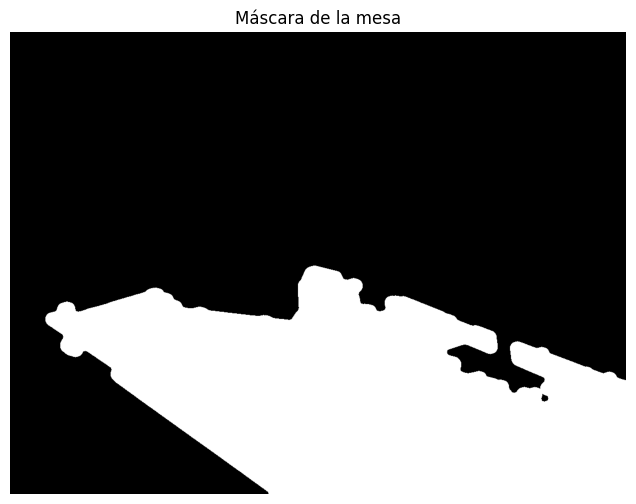

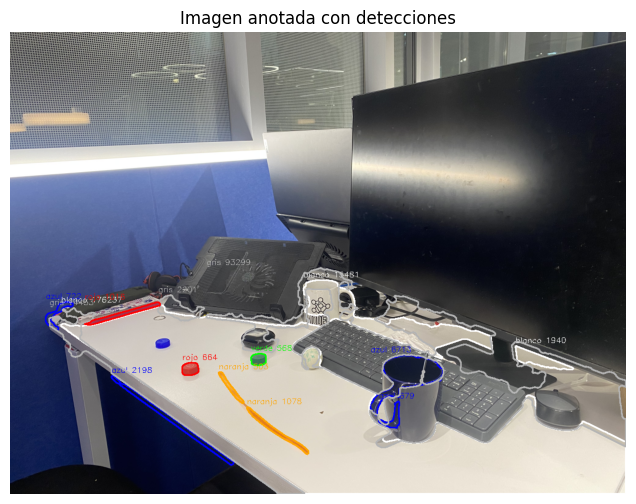

True

In [21]:
# ---------- CONFIG ----------
IMG_PATH = "Dataset/escritorio.jpg"
MIN_AREA = 500
MAX_AREA_FRAC = 0.7  # descarta regiones gigantescas (fondo)
MAX_W = 1200

DRAW_COLORS = {
    "azul": (255,0,0),
    "verde": (0,255,0),
    "rojo": (0,0,255),
    "naranja": (0,165,255),
    "blanco": (255,255,255),
    "gris": (180,180,180)
}

# ---------- LOAD & RESIZE ----------
img = cv.imread(IMG_PATH)
if img is None:
    raise FileNotFoundError("No se encontró la imagen: " + IMG_PATH)
h, w = img.shape[:2]
if w > MAX_W:
    scale = MAX_W / w
    img = cv.resize(img, (int(w*scale), int(h*scale)), interpolation=cv.INTER_AREA)
h, w = img.shape[:2]

# ---------- FUNCIÓN AUXILIAR PARA MOSTRAR ----------
def mostrar_img(title, img_bgr):
    """Muestra una imagen BGR dentro del notebook."""
    img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(8,6))
    plt.title(title)
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()

# ---------- MOSTRAR IMAGEN ORIGINAL (COLORES REALES) ----------
print("Imagen original (colores reales):")
mostrar_img("Imagen original", img)

# ---------- CALCULA CANALES ----------
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
v = hsv[:,:,2]
s = hsv[:,:,1]
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
L = lab[:,:,0]

# ---------- 1) MÁSCARA CANDIDATA A MESA ----------
cand_l = (L > 150)
cand_v_s = (v > 140) & (s < 90)
cand = np.where(cand_l | cand_v_s, 255, 0).astype(np.uint8)

kernel_close = cv.getStructuringElement(cv.MORPH_ELLIPSE, (31,31))
kernel_open  = cv.getStructuringElement(cv.MORPH_ELLIPSE, (9,9))
mask_cand = cv.morphologyEx(cand, cv.MORPH_CLOSE, kernel_close)
mask_cand = cv.morphologyEx(mask_cand, cv.MORPH_OPEN, kernel_open)

# ---------- 2) DETECTAR MESA ----------
conts, _ = cv.findContours(mask_cand.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
if len(conts) == 0:
    table_mask = np.zeros((h,w), dtype=np.uint8)
    table_mask[h//2:,:] = 255
else:
    largest = max(conts, key=cv.contourArea)
    table_mask = np.zeros((h,w), dtype=np.uint8)
    cv.drawContours(table_mask, [largest], -1, 255, -1)
    table_mask = cv.dilate(table_mask, cv.getStructuringElement(cv.MORPH_ELLIPSE,(21,21)), iterations=1)

ys = largest[:,:,1] if len(conts)>0 else None
if ys is not None:
    top_of_table = int(np.min(largest[:,:,1]))

# ---------- 3) HSV solo en la mesa ----------
hsv_masked = hsv.copy()
hsv_masked[table_mask == 0] = (0,0,0)

# ---------- 4) Rangos HSV ----------
rangos_colores = {
    "azul":     (np.array([85, 40, 40]),  np.array([135, 255, 255])),
    "verde":    (np.array([35, 50, 40]),  np.array([85, 255, 255])),
    "naranja":  (np.array([10, 100, 100]),np.array([25, 255, 255])),
    "rojo1":    (np.array([0, 100, 80]),  np.array([10, 255, 255])),
    "rojo2":    (np.array([170, 100, 80]),np.array([180, 255, 255])),
    "blanco":   (np.array([0, 0, 180]),   np.array([180, 50, 255])),
    "gris":     (np.array([0, 0, 60]),    np.array([180, 50, 200]))
}

# ---------- 5) Procesamiento por color ----------
def procesar_color(nombre, rango, hsv_img, draw_color, min_area=MIN_AREA):
    lower, upper = rango
    mask = cv.inRange(hsv_img, lower, upper)
    if mask.shape != table_mask.shape:
        mask = cv.resize(mask, (table_mask.shape[1], table_mask.shape[0]), interpolation=cv.INTER_NEAREST)
    mask = cv.bitwise_and(mask, table_mask)
    k1 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5,5))
    k2 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (11,11))
    mask = cv.morphologyEx(mask, cv.MORPH_OPEN, k1, iterations=1)
    mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, k2, iterations=1)
    conts, _ = cv.findContours(mask.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    objetos = []
    for c in conts:
        area = cv.contourArea(c)
        if area < min_area:
            continue
        x,y,ww,hh = cv.boundingRect(c)
        ratio = ww / float(hh) if hh>0 else 0
        if ratio > 8 or ratio < 0.12:
            continue
        if area > MAX_AREA_FRAC * h * w:
            continue
        objetos.append({"area": int(area), "bbox":(x,y,ww,hh), "contour": c})
    return objetos, mask

# ---------- 6) Detectar y anotar ----------
annotated = img.copy()
results = {}
masks = {}

objs_azul, mask_azul = procesar_color("azul", rangos_colores["azul"], hsv_masked, DRAW_COLORS["azul"])
results["azul"] = objs_azul
masks["azul"] = mask_azul

for color in ["verde","naranja","blanco","gris"]:
    objs, m = procesar_color(color, rangos_colores[color], hsv_masked, DRAW_COLORS[color])
    results[color] = objs
    masks[color] = m

mask_r1 = cv.inRange(hsv_masked, *rangos_colores["rojo1"])
mask_r2 = cv.inRange(hsv_masked, *rangos_colores["rojo2"])
mask_red = cv.bitwise_or(mask_r1, mask_r2)
mask_red = cv.bitwise_and(mask_red, table_mask)
conts, _ = cv.findContours(mask_red.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
objs_red=[]
for c in conts:
    area = cv.contourArea(c)
    if area < MIN_AREA: continue
    x,y,ww,hh = cv.boundingRect(c)
    objs_red.append({"area":int(area),"bbox":(x,y,ww,hh),"contour":c})
results["rojo"]=objs_red
masks["rojo"]=mask_red

for color, objs in results.items():
    color_draw = DRAW_COLORS[color]
    for o in objs:
        c = o["contour"]
        cv.drawContours(annotated, [c], -1, color_draw, 2)
        x,y,ww,hh = o["bbox"]
        cv.putText(annotated, f"{color} {o['area']}", (x, y-6), cv.FONT_HERSHEY_SIMPLEX, 0.5, color_draw, 1)

# ---------- 7) Mostrar resultados ----------
print("Resultados (color : cantidad de objetos) y áreas:")
for color, objs in results.items():
    areas = [o['area'] for o in objs]
    print(f"{color}: {len(areas)} objetos | áreas = {areas}")

# ---------- Mostrar y guardar máscaras y anotaciones ----------
output_dir = 'Resultados/segmentacion'
frame_path = os.path.join(output_dir, f"mascara_mesa.png")
frame_path_ = os.path.join(output_dir, f"detecciones.png")


mostrar_img("Máscara de la mesa", cv.cvtColor(table_mask, cv.COLOR_GRAY2BGR))
cv.imwrite(frame_path, cv.cvtColor(table_mask, cv.COLOR_GRAY2BGR))

mostrar_img("Imagen anotada con detecciones", annotated)
cv.imwrite(frame_path_, annotated)



El código desarrollado permite identificar y segmentar objetos de distintos colores ubicados sobre la mesa, utilizando una combinación de procesamiento en HSV y LAB para aislar correctamente la superficie de trabajo. La creación de máscaras fue fundamental, especialmente la máscara principal de la mesa, ya que permitió excluir el fondo y concentrar la detección solo en los objetos reales. Esto ayudó a reducir mucho el ruido y los falsos positivos.

Además, las máscaras por color ayudaron a reconocer objetos específicos (azul, rojo, verde, naranja, blanco y gris) con bastante precisión. El resultado muestra los contornos y las áreas de cada detección directamente sobre la imagen, junto con su etiqueta de color. Los valores de área corresponden al tamaño en píxeles de cada objeto, lo que permite tener una idea aproximada de sus dimensiones relativas.

En general, el procesamiento morfológico y la selección del ROI fueron claves para obtener un resultado limpio. El sistema logró diferenciar bien los colores y segmentar correctamente los objetos que estaban sobre la mesa, mostrando un buen desempeño tanto visual como numérico en la detección.